# Applying Classification models on Breast Cancer Prediction dataset

# Data Preprocessing
* ##  Importing Libraries and Dataset 

In [1]:
# Importing Libraries
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns

In [2]:
# Importing the dataset
dataset = pd.read_csv("breast_cancer.csv")
dataset.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


* ## Data summary

In [3]:
# describe() function gives summary of the data
dataset.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

Ten real-valued features:
  * radius: distances from center to points on the perimeter
  * texture: standard deviation of gray-scale values
  * perimeter
  * area
  * smoothness: local variation in radius lengths
  * compactness: perimeter^2 / area - 1.0
  * concavity: severity of concave portions of the contour
  * concave points: number of concave portions of the contour
  * symmetry
  * fractal dimension: "coastline approximation" - 1

* ## Finding Missing Values

In [5]:
dataset.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

* ## Checking outliers

In [6]:
# Calculating percentiles
Q1 = dataset.quantile(0.05)
Q3 = dataset.quantile(0.95)
# IQR = Inter Quartile Range
IQR = Q3 - Q1

In [7]:
# Checking for any outliers
# Ignore ID column.
((dataset < (Q1 - 1.5 * IQR)) | (dataset > (Q3 + 1.5 * IQR))).sum()

area_mean                   0
area_se                     2
area_worst                  0
compactness_mean            0
compactness_se              0
compactness_worst           0
concave points_mean         0
concave points_se           1
concave points_worst        0
concavity_mean              0
concavity_se                2
concavity_worst             0
diagnosis                   0
fractal_dimension_mean      0
fractal_dimension_se        4
fractal_dimension_worst     1
id                         11
perimeter_mean              0
perimeter_se                2
perimeter_worst             0
radius_mean                 0
radius_se                   2
radius_worst                0
smoothness_mean             0
smoothness_se               1
smoothness_worst            0
symmetry_mean               0
symmetry_se                 1
symmetry_worst              0
texture_mean                0
texture_se                  1
texture_worst               0
dtype: int64

* ## Visualizing Corelation Matrix
Let's take a look at corelation between our variables
* dataset.corr() is used to find corelations

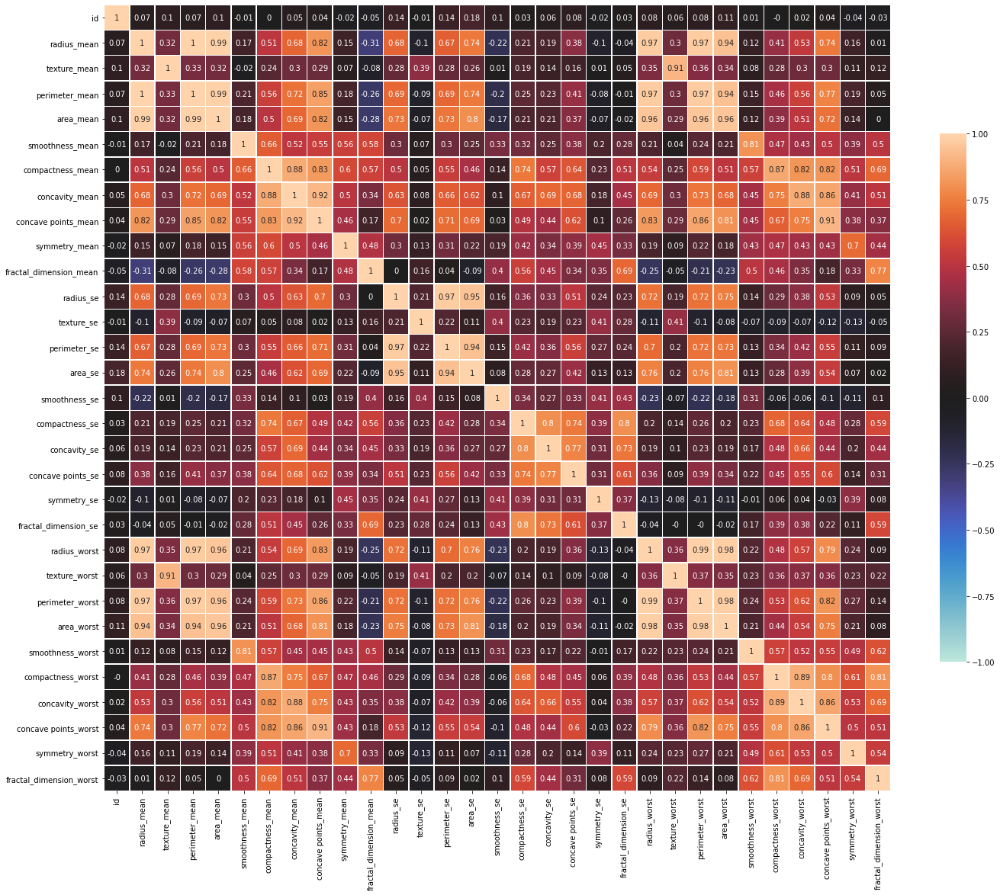

In [8]:
# Instead of just displaying corelations, use heatmap to visualize it to get better understandings of corelation
plt.figure(figsize=(20,20))
 
# Draw the heatmap
# Here round(2) will round the values of corelations upto 2 decimal points
sns.heatmap(dataset.corr().round(2), vmin=-1, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True,)
plt.tight_layout()

As we can see in our heatmap, radius_mean column has corelation of 1 and 0.99 with columns perimeter_mean and area_mean. 
* It means that these three columns are very much similar to each other 
* That's why we'll only take one of them for further analysis.(This will not affect our model)
* Same goes with our all 'mean' and 'worst' columns
* For better understanding we are considering only 'mean' columns

In [9]:
# I've made drp_cols variable and assigned list of all the columns that to be deleted.
drp_cols = ['radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst',   'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst','concavity_mean','concavity_se', 'concave points_mean', 'concave points_se']
dataset = dataset.drop(drp_cols, axis=1)

In [10]:
# Let's check how many and which columns are there in our dataset 
print(dataset.columns)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'symmetry_mean',
       'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se',
       'area_se', 'smoothness_se', 'compactness_se', 'symmetry_se',
       'fractal_dimension_se'],
      dtype='object')


In [11]:
drp_cols = ['perimeter_mean','perimeter_se', 'area_mean', 'area_se']
dataset = dataset.drop(drp_cols,axis=1)

In [12]:
dataset.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'smoothness_mean',
       'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'smoothness_se', 'compactness_se',
       'symmetry_se', 'fractal_dimension_se'],
      dtype='object')

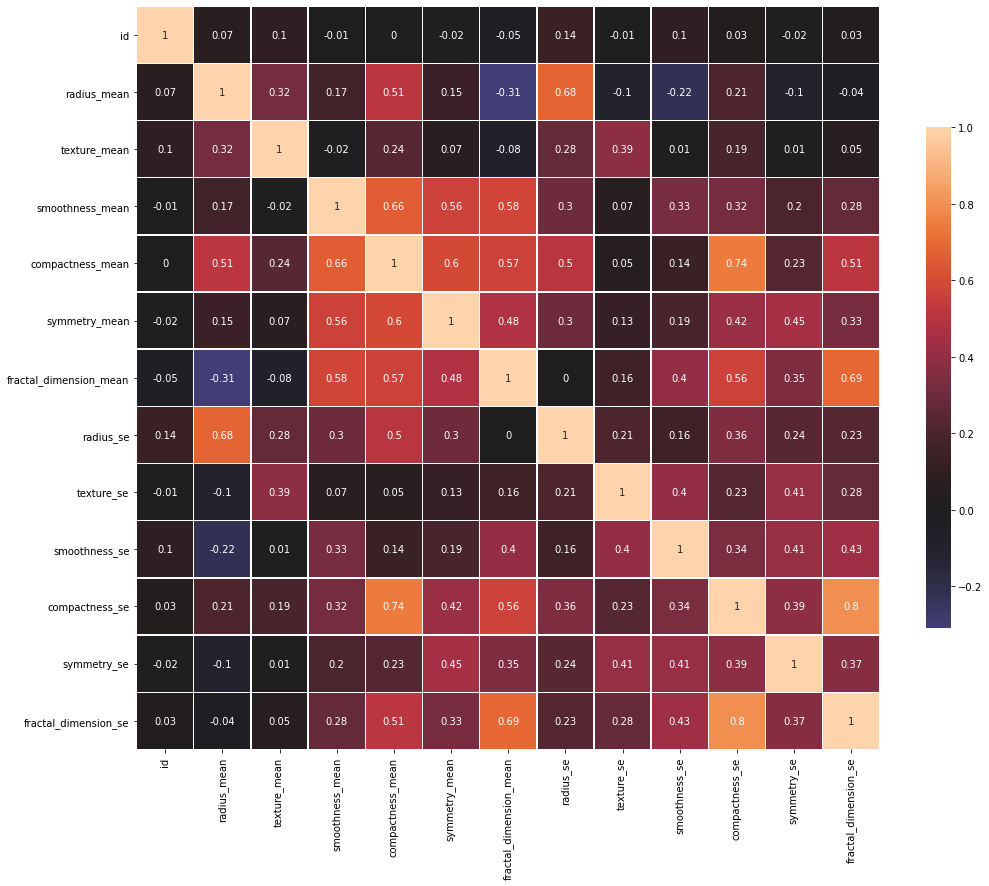

In [13]:
# now look at changes we've made ...
plt.figure(figsize=(15,15))

sns.heatmap(dataset.corr().round(2), center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True)
plt.tight_layout()

In [14]:
dataset.head()

,id,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,symmetry_se,fractal_dimension_se
0,842302,M,17.99,10.38,0.11840,0.27760,0.2419,0.07871,1.0950,0.9053,0.006399,0.04904,0.03003,0.006193
1,842517,M,20.57,17.77,0.08474,0.07864,0.1812,0.05667,0.5435,0.7339,0.005225,0.01308,0.01389,0.003532
2,84300903,M,19.69,21.25,0.10960,0.15990,0.2069,0.05999,0.7456,0.7869,0.006150,0.04006,0.02250,0.004571
3,84348301,M,11.42,20.38,0.14250,0.28390,0.2597,0.09744,0.4956,1.1560,0.009110,0.07458,0.05963,0.009208
4,84358402,M,20.29,14.34,0.10030,0.13280,0.1809,0.05883,0.7572,0.7813,0.011490,0.02461,0.01756,0.005115


* ## Visualizing our data

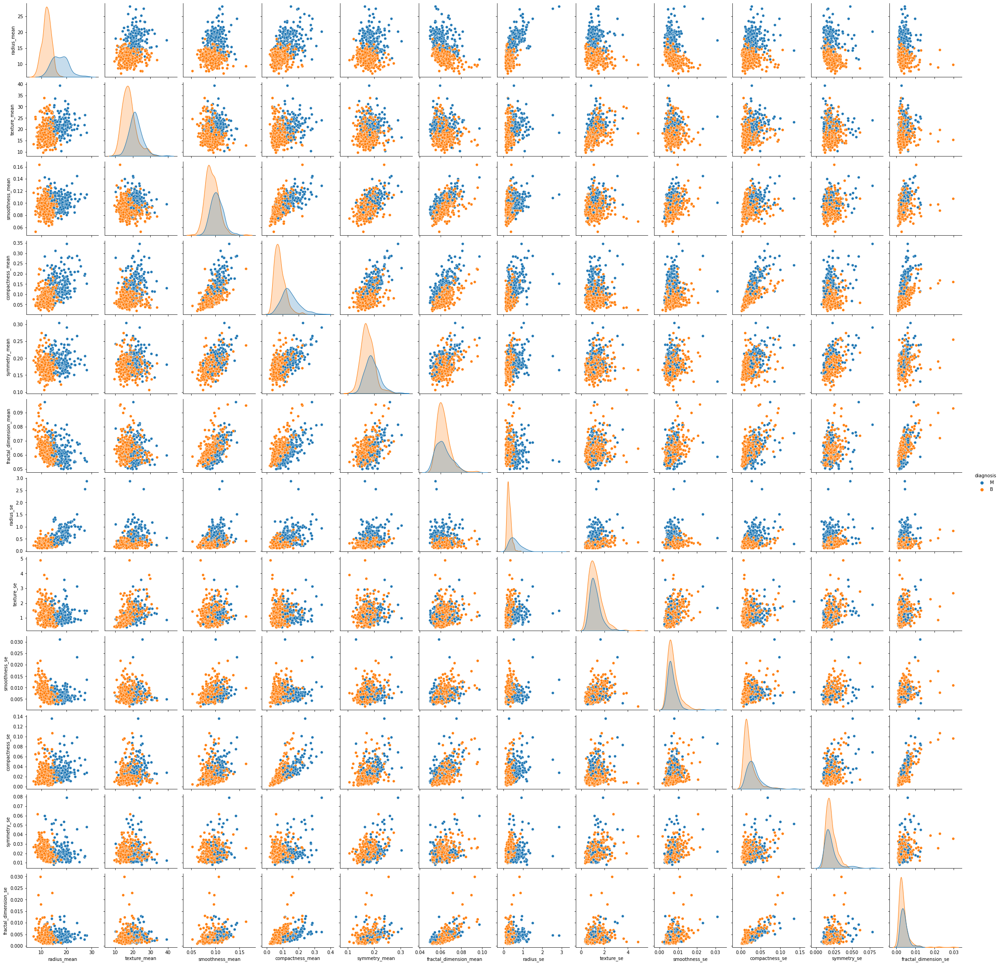

In [15]:
data = dataset.drop(['id'], axis=1)
sns.pairplot(data=data,hue='diagnosis')

<AxesSubplot:xlabel='diagnosis', ylabel='count'>

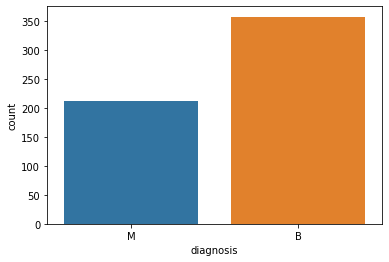

In [16]:
#  M = malignant, B = benign
sns.countplot(x=dataset['diagnosis'])

* ## Locating Dependent and Independent variables

In [17]:
X = dataset.iloc[:, 2:]
y = dataset.iloc[:, 1]

* ## Splitting the data into training and testing set

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

# Working with Logistic Regression

In [19]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

In [20]:
# Prediction
y_pred = logreg.predict(X_test)
y_pred

array(['B', 'M', 'M', 'B', 'B', 'M', 'M', 'M', 'B', 'B', 'B', 'M', 'B',
       'M', 'B', 'M', 'B', 'B', 'B', 'M', 'B', 'B', 'M', 'B', 'B', 'B',
       'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'M',
       'M', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'M',
       'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'M', 'M', 'M', 'B',
       'B', 'M', 'M', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'B', 'B', 'B',
       'B', 'B', 'M', 'B', 'B', 'M', 'M', 'M', 'B', 'M', 'B', 'B', 'B',
       'B', 'B', 'B', 'B', 'B', 'M', 'M', 'B', 'M', 'M', 'B', 'M', 'M',
       'B', 'B', 'B', 'M', 'B', 'B', 'M', 'B', 'M', 'M', 'B', 'M', 'B',
       'B', 'B', 'M', 'M', 'B', 'B', 'M', 'B', 'M', 'B', 'B', 'B', 'M',
       'M', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B',
       'B', 'B', 'B', 'M', 'M', 'M', 'B', 'M', 'B', 'B', 'B', 'B', 'M',
       'M', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'M', 'B',
       'M', 'B'], dtype=object)

* ## Checking accuracy of our model

In [21]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test,y_pred)
accuracy

0.9122807017543859

* ## Making the confusion matrix

In [22]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[103   5]
 [ 10  53]]


# KNN (K Nearest Neighbors) Classification

In [23]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors = 3)
knn_model.fit(X_train,y_train)
y_predict_knn = knn_model.predict(X_test)

In [24]:
y_predict_knn

array(['B', 'M', 'M', 'B', 'B', 'M', 'M', 'B', 'B', 'B', 'M', 'M', 'M',
       'M', 'B', 'M', 'B', 'B', 'B', 'M', 'B', 'B', 'M', 'B', 'B', 'B',
       'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'M',
       'M', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'M',
       'M', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'M', 'M', 'B', 'B',
       'B', 'M', 'M', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'B', 'M', 'B',
       'B', 'B', 'M', 'B', 'M', 'M', 'M', 'B', 'B', 'M', 'M', 'B', 'B',
       'B', 'B', 'B', 'B', 'B', 'M', 'M', 'B', 'M', 'M', 'B', 'M', 'M',
       'B', 'B', 'M', 'M', 'B', 'B', 'M', 'B', 'B', 'M', 'B', 'M', 'B',
       'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'B', 'B', 'M',
       'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'M', 'B',
       'B', 'B', 'B', 'M', 'M', 'M', 'B', 'M', 'B', 'B', 'B', 'B', 'M',
       'M', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B',
       'M', 'B'], dtype=object)

* ## Checking accuracy with KNN model

In [25]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test,y_predict_knn)
accuracy

0.8713450292397661

* ## Confusion matrix(KNN model)

In [26]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_predict_knn)
print(cm)

[[100   8]
 [ 14  49]]


* ## Hyperparameter Tuning

In [27]:
ks =21
mean_acc = np.zeros((ks-1))

for n in range(1,ks):
    neighbors = KNeighborsClassifier(n_neighbors=n).fit(X_train,y_train)
    y_hat = neighbors.predict(X_test)
    mean_acc[n-1]=accuracy_score(y_test,y_hat)

In [28]:
mean_acc

array([0.8245614 , 0.87719298, 0.87134503, 0.88304094, 0.9005848 ,
       0.89473684, 0.89473684, 0.88304094, 0.88888889, 0.88304094,
       0.87134503, 0.89473684, 0.87719298, 0.88304094, 0.88888889,
       0.88888889, 0.9005848 , 0.87719298, 0.9005848 , 0.9005848 ])

In [29]:
max(mean_acc)

0.9005847953216374

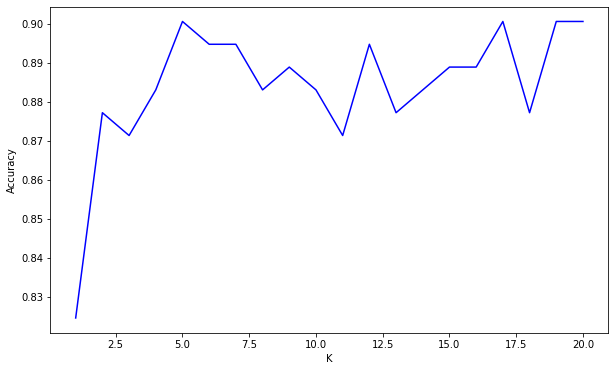

In [30]:
plt.figure(figsize=(10,6))
plt.plot(range(1,ks),mean_acc,'b')
plt.ylabel('Accuracy')
plt.xlabel('K')
plt.show()

# Summary
## Logistic regression : 
* Logistic regression does not really have any critical hyperparameters to tune.
* Maximum Accuracy with Logistic Regression model is : 0.91 (model is 91% accurate)

## KNN :
* We've done hyperparameter tuning for KNN because it is actually tricky to assumne any random value for K.
* for K = 5, we've got 90% accuracy.